# Evaluation of the neural segmentation models

This notebook contains the main results of the paper, where we evaluate the baseline and neural models on both portions of the dataset, and vary the number of training samples for the neural models. We use several evaluation functions from from the `evluation.py` file to perform the evaluation. Note that we have already performed the training and evaluation beforehand, as this can take quite some time, especially on a CPU. Both the training scripts and the trained models are provided if you wish to use these models yourself.

## Index

1. [Standard Experiment](#standard_experiment)
2. [Adding Pages without annotations](#extended_experiment)
3. [Varying the number of training samples](#num_training_samples)

In [1]:
import os
import json
import torch
import numpy as np
import pandas as pd
from PIL import Image
from tqdm import tqdm
from glob import glob
import pycocotools.coco
import matplotlib.pyplot as plt
from pycocotools.coco import COCO
from pycocotools.mask import decode, encode, merge, iou, area, frPyObjects    

# Import the evaluation code that calculates PQ
from utils import *
from evaluation import *

# config settings
plt.rcParams["savefig.bbox"] = "tight"

<a id="standard_experiment"><h2>Standard Experiment</h2></a>

We will start by loading in the the predictions of the models and the ground truth, and do some small visualizations, after which we compare the scores of all the three models. Although the Detectron2 and Mask2Former libraries have their own versions of post processing the predictions, we have decided to write our own functions, as the Meta implementations are not identical to the one used in the original Kirilov paper. Most notably, they do not guarantee no overlappen masks, which is a requirement for the correct implementation of the PQ metric. This does mean that the evaluation takes a bit longer as the postprocessing is done on a CPU.

The first step is loading in the classic dataset and then run the evaluation of all three models.

In [2]:
gold_standard_clean = read_json('../resources/dataset/test/classic_test.json')
maskrcnn_clean_predictions = read_json('../resources/model_outputs/MaskRCNN/clean/coco_instances_results.json')
mask2former_clean_predictions = read_json('../resources/model_outputs/Mask2Former/clean/coco_instances_results.json')
rulebased_clean_predictions = read_json('../resources/model_outputs/MorphologyBaseline/clean/coco_instances_results.json')

# Also load the gold standard in the COCO format
COCO_clean_dataset = COCO('../resources/dataset/test/classic_test.json')

loading annotations into memory...
Done (t=0.02s)
creating index...
index created!


Let's first just show an example of the predictions of the Mask RCNN model

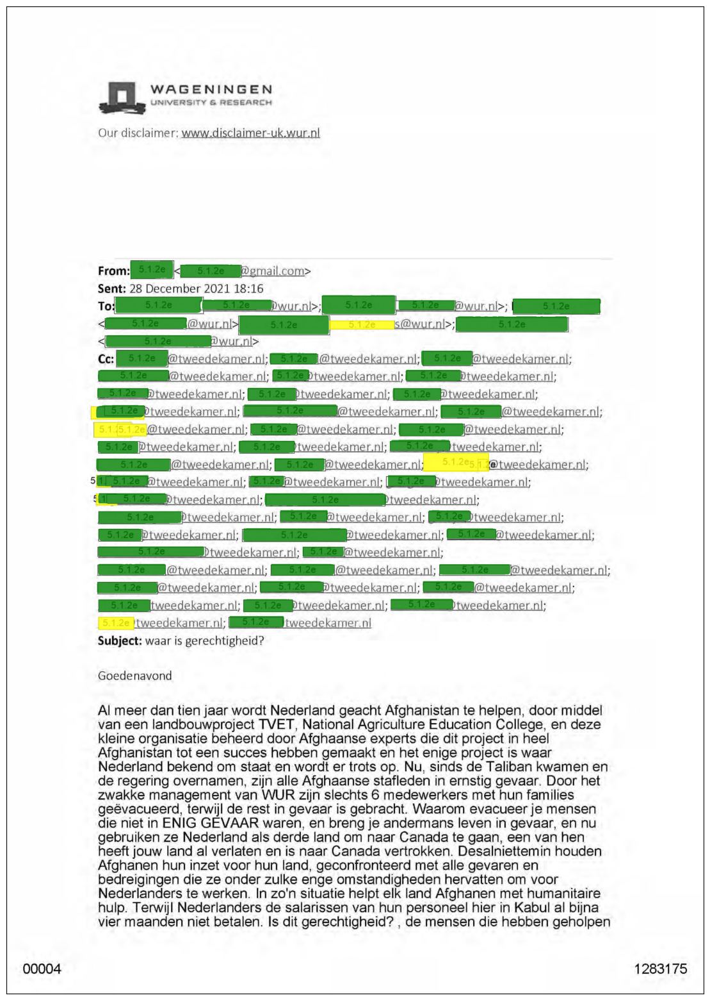

In [3]:
visualize_annotations('woo-niet-evacueren-medewerkers-atvet-documenten-9.png', gold_standard_clean, maskrcnn_clean_predictions)

Now it is time to evaluate the models over all pages with annotations, so we set `count_empty_pages` to false. We will also not do filtering for the rulebased models, as the model already produces non overlapping predictions.

In [4]:
maskrcnn_clean_results = evaluate_predictions(gold_standard_clean['annotations'],
                                                             maskrcnn_clean_predictions,
                                              confidence_score=0.50, iou_score=0.5,
                                             count_empty_pages=False)

mask2former_clean_results = evaluate_predictions(gold_standard_clean['annotations'],
                                                             mask2former_clean_predictions,
                                                confidence_score=0.5, iou_score=0.5,
                                                count_empty_pages=False)

rulebased_clean_results = evaluate_predictions(gold_standard_clean['annotations'],
                                                             rulebased_clean_predictions,
                                              do_filtering=False,
                                              confidence_score=None)

100%|█████████████████████████████████████████| 281/281 [00:03<00:00, 83.46it/s]


After we have obtained the scores for all of the three models, we are going to combine them in a dataframe, so that we can easily compare the different scores, also splitted out to the different redaction types.

In [5]:
classic_results = pd.concat([calculate_color_specific_metrics(rulebased_clean_results)[['black', 'color', 'gray', 'border', 'total']].T[['SQ', 'P', 'R','F1']],
                             calculate_color_specific_metrics(maskrcnn_clean_results)[['black', 'color', 'gray', 'border', 'total']].T[['SQ', 'P', 'R','F1']],
                             calculate_color_specific_metrics(mask2former_clean_results)[['black', 'color', 'gray', 'border', 'total']].T[['SQ', 'P', 'R','F1']]],
                            axis=1, keys=["Morphology+OCR", "MaskRCNN", "Mask2Former"])

In [6]:
def highlight_table(dataframe):
    return dataframe.style.format(precision=2).apply(lambda col: np.where(col == col.max(), "font-weight: bold", ""), axis=0)

In [7]:
highlight_table(classic_results)

There are a few interesting observations to make here, most notably that both the MaskRCNN and Mask2Former models significantly outperform the Morphology on overall performance. The Mask RCNN model is the best performing model overall, and all the models have difficulty with the gray and border redactions. Apart from this, the Segmentation Quality (SQ) of all three models is very similar. Next up we will examine some of the mistakes of the models by visualizing them, to see if we can discern some patterns. We will sort on the worst performing pages for each model, and show these, making comparisons between the different models. We will start with the recall of the rulebased models, as this is where the rulebased model performs worst.

In [8]:
top_5_FN_rulebased_images = [item['file_name'] for item in COCO_clean_dataset.loadImgs(rulebased_clean_results.sort_values(by='FN', ascending=False)['image_id'][:5])]

  0%|                                                     | 0/5 [00:00<?, ?it/s]

nl.mnre1058.2i.2022.1.misc.9-57.png


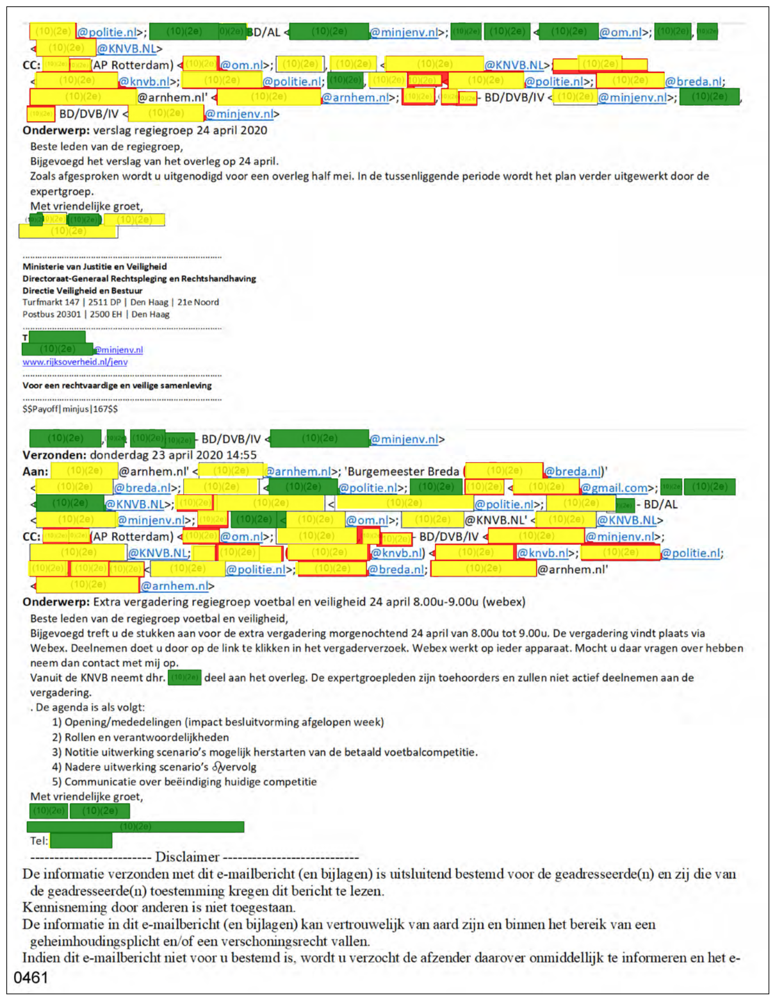

 20%|█████████                                    | 1/5 [00:14<00:56, 14.00s/it]

nl.mnre1058.2i.2022.1.misc.9-17.png


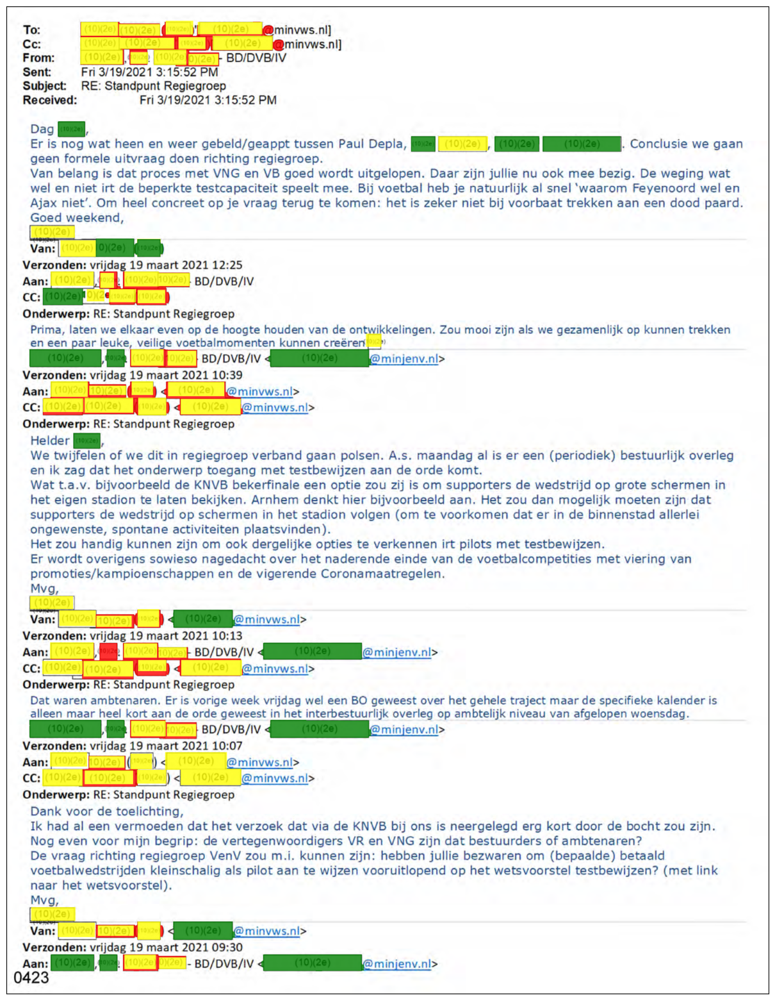

 40%|██████████████████                           | 2/5 [00:25<00:37, 12.53s/it]

nl.mnre1058.2i.2022.1.misc.9-52.png


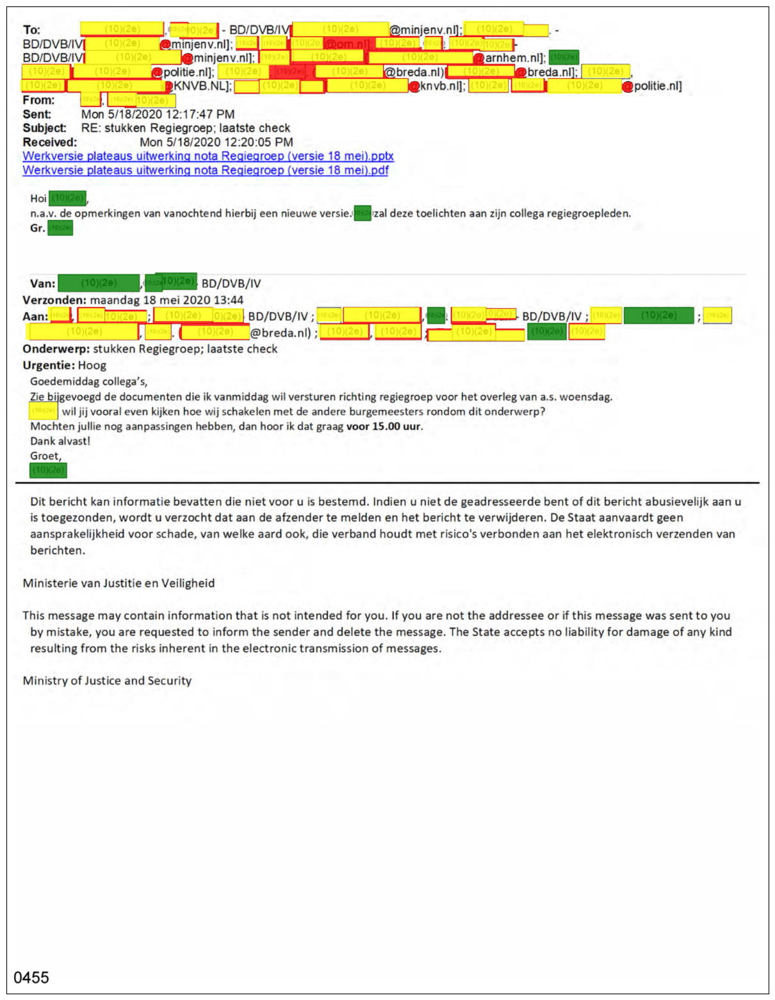

 60%|███████████████████████████                  | 3/5 [00:34<00:21, 10.81s/it]

documenten-180-226-61.png


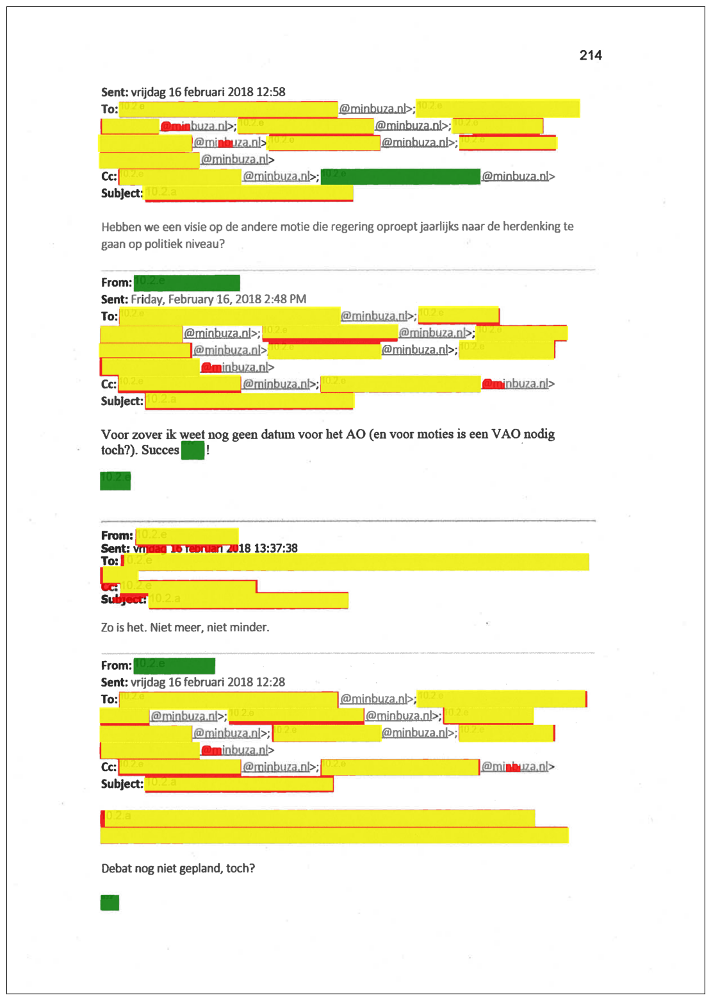

 80%|████████████████████████████████████         | 4/5 [00:42<00:09,  9.81s/it]

woo-niet-evacueren-medewerkers-atvet-documenten-7.png


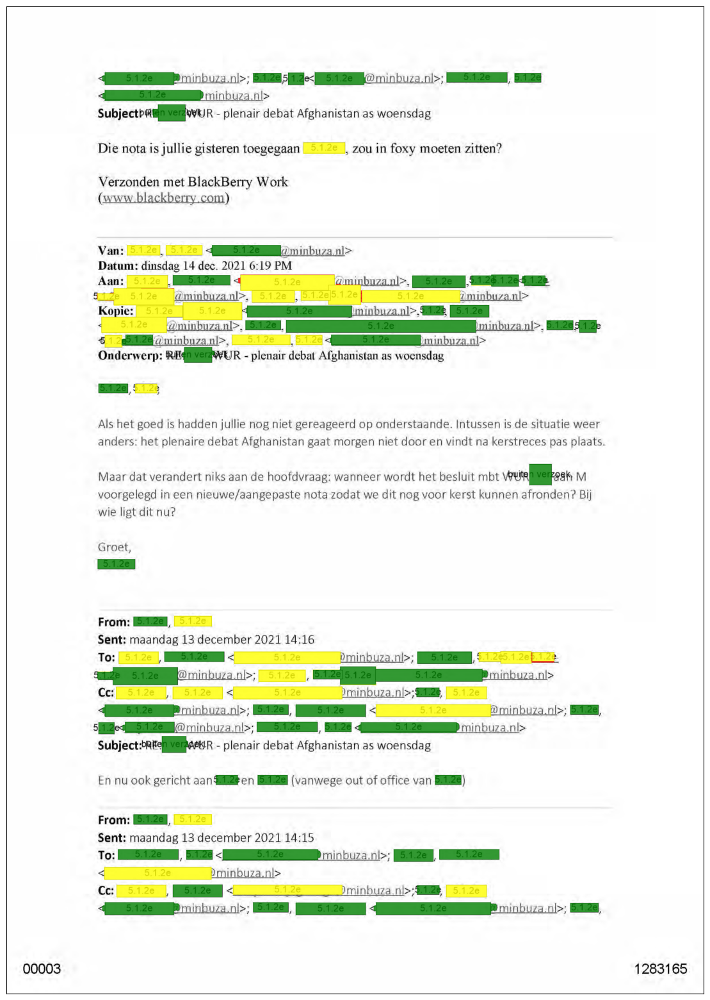

100%|█████████████████████████████████████████████| 5/5 [00:57<00:00, 11.44s/it]


In [9]:
for filename in tqdm(top_5_FN_rulebased_images):
    print(filename)
    visualize_annotations(filename, gold_standard_clean, rulebased_clean_predictions, confidence_score=None)

In the above five pages we see the main problem with the rulebased model: it 'fuses' a lot of predictions, as shown by the red masks, which also means that it will miss the actual smaller redactions, as the IOU of these with the large FP is not larger than 0.5. This problem is largely solved by the neural models, as we show with one of the picture below.

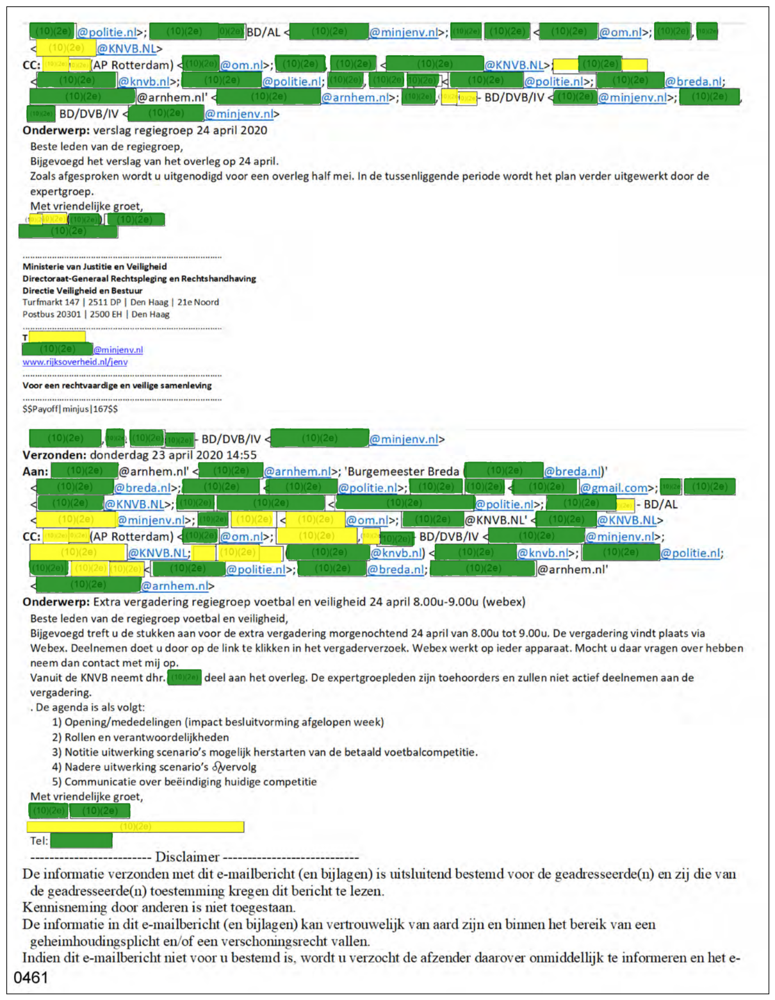

In [10]:
visualize_annotations('nl.mnre1058.2i.2022.1.misc.9-57.png', gold_standard_clean, maskrcnn_clean_predictions)

Although still not perfect, the Mask RCNN model does not make any false positive mistakes, and misses a lot less redactions than the rulebased model.

<a id="extended_experiment"><h2>Adding pages without annotations</h2></a>

Now that we have shown the results of the models on the dataset that only contains pages with redactions, we will show what happens when we introduce pages without redactions to the dataset, and how this affects the model performance. Apart from looking from the scores on the four categories, we now also look at the empty pages, and how many false positives each of the models make on this part of the dataset, and how big these mistakes are on average. We experiment a little bit with the confidence values of the models and how to adjust these, as this might lead to less false positives at a relatively low cost.

In [11]:
gold_standard_extended = read_json('../resources/dataset/test/extended_test.json')
maskrcnn_extended_predictions = read_json('../resources/model_outputs/MaskRCNN/extended/coco_instances_results.json')
mask2former_extended_predictions = read_json('../resources/model_outputs/Mask2Former/extended/coco_instances_results.json')
rulebased_extended_predictions = read_json('../resources/model_outputs/MorphologyBaseline/extended/coco_instances_results.json')

# Also load the gold standard in the COCO format
COCO_extended_dataset = COCO('../resources/dataset/test/extended_test.json')

loading annotations into memory...
Done (t=0.05s)
creating index...
index created!


In [78]:
maskrcnn_extended_results = evaluate_predictions(gold_standard_extended['annotations'],
                                                             maskrcnn_extended_predictions,
                                              confidence_score=0.70,
                                                count_empty_pages=True,
                                                iou_score=0.70,
                                                do_filtering=True)
mask2former_extended_results = evaluate_predictions(gold_standard_extended['annotations'],
                                                             mask2former_extended_predictions,
                                                confidence_score=0.50,
                                                   count_empty_pages=True,
                                                   iou_score=0.50,
                                                   do_filtering=True)
rulebased_extended_results = evaluate_predictions(gold_standard_extended['annotations'],
                                                             rulebased_extended_predictions,
                                              do_filtering=False,
                                                 count_empty_pages=True)

100%|█████████████████████████████████████████| 90/90 [00:00<00:00, 1399.88it/s]


Like with the previous experiment, we will start by simply showing the scores of the models on the complete dataset splitted to the different redaction types.

In [79]:
extended_results = pd.concat([calculate_color_specific_metrics(rulebased_extended_results)[['black', 'color', 'gray', 'border', 'total']].T[['SQ', 'P', 'R','F1']],
                             calculate_color_specific_metrics(maskrcnn_extended_results)[['black', 'color', 'gray', 'border', 'total']].T[['SQ', 'P', 'R','F1']],
                             calculate_color_specific_metrics(mask2former_extended_results)[['black', 'color', 'gray', 'border', 'total']].T[['SQ', 'P', 'R','F1']]],
                            axis=1, keys=["Morphology+OCR", "MaskRCNN", "Mask2Former"])

/Users/rubenvanheusden/Desktop/IJDARKaj/notebooks/evaluation.py:122: RuntimeWarning: invalid value encountered in scalar divide
  R = dataframe['TP'].sum() / (dataframe['TP'].sum() + dataframe['FN'].sum())
/Users/rubenvanheusden/Desktop/IJDARKaj/notebooks/evaluation.py:122: RuntimeWarning: invalid value encountered in scalar divide
  R = dataframe['TP'].sum() / (dataframe['TP'].sum() + dataframe['FN'].sum())
/Users/rubenvanheusden/Desktop/IJDARKaj/notebooks/evaluation.py:122: RuntimeWarning: invalid value encountered in scalar divide
  R = dataframe['TP'].sum() / (dataframe['TP'].sum() + dataframe['FN'].sum())


In [80]:
highlight_table(extended_results)

The story is much the same for the extended results as it is for the classic experiments, with both the MaskRCNN and the Mask2Former model significantly outperforming the Morphology based model. For all models, the black and color redactions are the best performing classes, and the gray and border redactions are more tricky. What is interesting to note is that the performance of the Mask2Former drops significantly in terms of recall. As we will see in the next part, this is largely due to the fact that it hardly picks up false positives, which does come with this recall trade-off.

We now obtain the number of false positives for each of the models and print this. After which we will also show some examples.

In [81]:
rulebased_empty_FPs = rulebased_extended_results[rulebased_extended_results['redaction_type'] == 'no_annotation'].FP.sum()
maskrcnn_empty_FPs = maskrcnn_extended_results[maskrcnn_extended_results['redaction_type'] == 'no_annotation'].FP.sum()
mask2former_empty_FPs = mask2former_extended_results[mask2former_extended_results['redaction_type'] == 'no_annotation'].FP.sum()

In [82]:
print("The morphology model has %d false positives" % rulebased_empty_FPs)
print("The MaskRCNN model has %d false positives" % maskrcnn_empty_FPs)
print("The Mask2Former model has %d false positives" % mask2former_empty_FPs)

The morphology model has 1127 false positives
The MaskRCNN model has 52 false positives
The Mask2Former model has 2 false positives


As we can see, the Mask2Former model has by far the fewest false positives, although it does come with a tradeoff as we have seen in the previous table. First we will look at some of the mistakes of the Morphology and MaskRCNN models.

In [83]:
top_5_FP_maskrcnn_images = [item['file_name'] for item in COCO_extended_dataset.loadImgs(maskrcnn_extended_results[maskrcnn_extended_results['redaction_type'] == 'no_annotation'].sort_values(by='FP', ascending=False)['image_id'][:10])]

In [84]:
top_5_FP_maskrcnn_images

['heel_moeilijk-7.png',
 'Bijlage-14.png',
 'Gelakte stukken Wob-verzoek omgevingsproces Ternaard 2e deel-193.png',
 'Bijlagen bij besluit Woo-verzoek over verantwoord medicijngebruik-60.png',
 'bijlage-beslisnota-s-mirt-overzicht-2023-deltaprogramma-2023-en-geactualiseerde-spelregels-van-het-mirt-2.png',
 '94.46 indeling terras-1.png',
 '392._hol_met_magazine_mipim_2017-1.png',
 'bijlage-beslisnota-s-mirt-overzicht-2023-deltaprogramma-2023-en-geactualiseerde-spelregels-van-het-mirt-6.png',
 'Gelakte stukken Wob-verzoek omgevingsproces Ternaard 2e deel-102.png',
 'Gelakte stukken Wob-verzoek omgevingsproces Ternaard 2e deel-134.png']

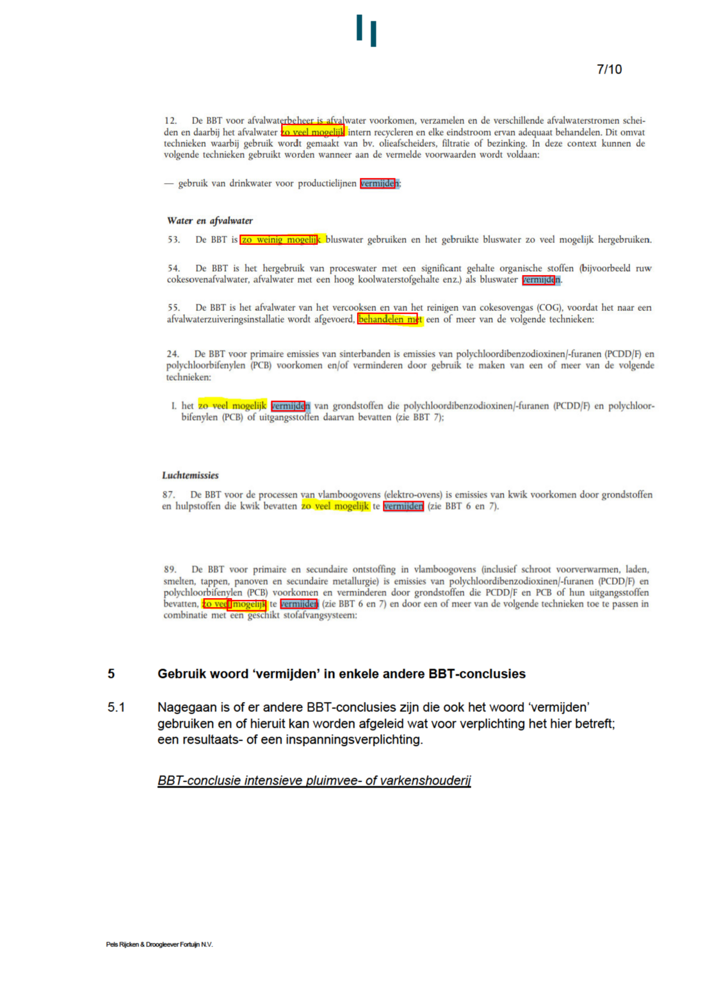

In [85]:
visualize_annotations('heel_moeilijk-7.png', gold_standard_extended, maskrcnn_extended_predictions,
                     vis_mode='boxes')

The image above shows an example of a page with a lot of false positives for the MaskRCNN model. The problem here is stat the text in color, is not redacted, it is merely text that has been highlighted. However, as the model has seen several examples of colored redactions with code, it mistakenly predicted these as redactions. The Mask2Former model only makes one mistakes ofr this page.

Next we look at the two mistakes that the Mask2Former model made, and at some of the things that the model now missed.

In [86]:
mask2former_extended_results[mask2former_extended_results['redaction_type'] == 'no_annotation'].sort_values(by='FP', ascending=False)

,TP,FP,FN,IOU,redaction_type,image_id,sizes
313,0,1,0,0.0,no_annotation,106,4276
396,0,1,0,0.0,no_annotation,347,165085
281,0,0,0,0.0,no_annotation,1,0
376,0,0,0,0.0,no_annotation,292,0
371,0,0,0,0.0,no_annotation,275,0
...,...,...,...,...,...,...,...
322,0,0,0,0.0,no_annotation,133,0
321,0,0,0,0.0,no_annotation,132,0
320,0,0,0,0.0,no_annotation,128,0
319,0,0,0,0.0,no_annotation,125,0


In [87]:
mask2former_no_annotation_FPs = [item['file_name'] for item in COCO_extended_dataset.loadImgs(mask2former_extended_results[mask2former_extended_results['redaction_type'] == 'no_annotation'].sort_values(by='FP', ascending=False)['image_id'][:2])]

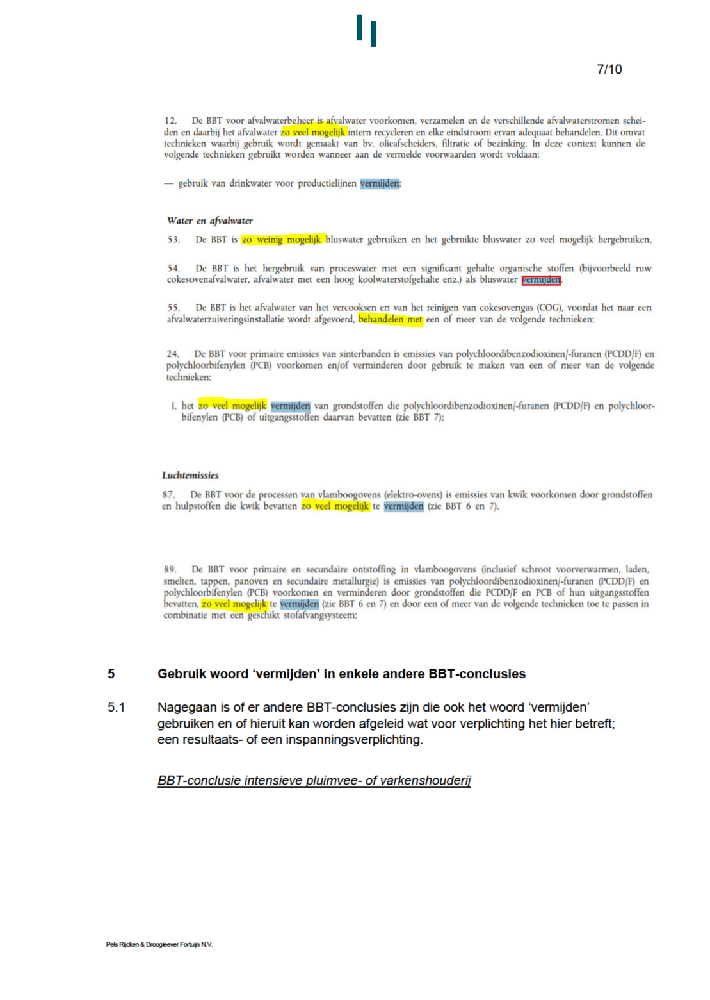

In [88]:
visualize_annotations('heel_moeilijk-7.png', gold_standard_extended, mask2former_extended_predictions,
                     vis_mode='boxes')

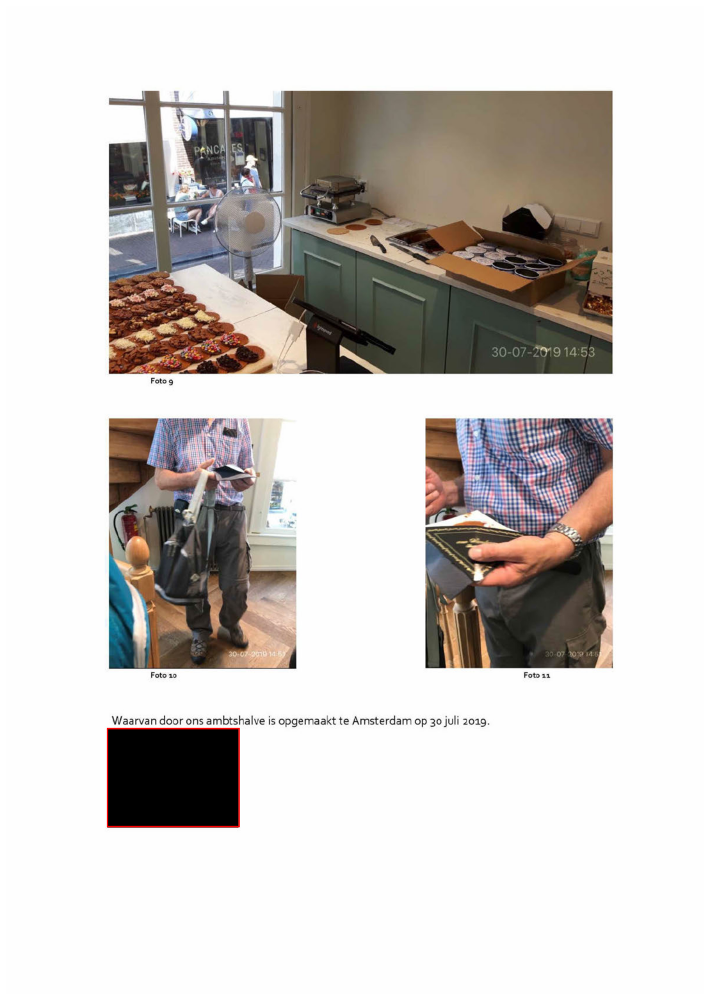

In [89]:
visualize_annotations('2019-07-30_Rapportage_van_bevindingen-4.png', gold_standard_extended, mask2former_extended_predictions,
                     vis_mode='boxes')

Although the Mask2Former model performs very well on the robustness when it comes to pages that contain no annotations, the question remains whether or not this training is really necessary. To test this, we compare to model to the version only trained on annotations, and test on the compete set. We also do this for the MaskRCNN model, and check how many false positives both models get.


In [90]:
maskrcnn_clean_trained_predictions = read_json('../resources/model_outputs/MaskRCNN/clean_trained/coco_instances_results.json')
mask2former_clean_trained_predictions = read_json('../resources/model_outputs/Mask2Former/clean_trained/coco_instances_results.json')

In [91]:
maskrcnn_clean_trained_results = evaluate_predictions(gold_standard_extended['annotations'],
                                                             maskrcnn_clean_trained_predictions,
                                              confidence_score=0.50,
                                                count_empty_pages=True,
                                                iou_score=0.50,
                                                do_filtering=True)

mask2former_clean_trained_results = evaluate_predictions(gold_standard_extended['annotations'],
                                                             mask2former_clean_trained_predictions,
                                                confidence_score=0.50,
                                                   count_empty_pages=True,
                                                   iou_score=0.50,
                                                   do_filtering=True)

100%|█████████████████████████████████████████| 138/138 [00:03<00:00, 40.10it/s]


In [92]:
maskrcnn_clean_trained_empty_FPs = maskrcnn_clean_trained_results[maskrcnn_clean_trained_results['redaction_type'] == 'no_annotation'].FP.sum()
mask2former_clean_trained_empty_FPs = mask2former_clean_trained_results[mask2former_clean_trained_results['redaction_type'] == 'no_annotation'].FP.sum()

In [93]:
print("The MaskRCNN model trained only on clean data has %d false positives" % maskrcnn_clean_trained_empty_FPs)
print("The Mask2Former model trained only on clean data has %d false positives" % mask2former_clean_trained_empty_FPs)

The MaskRCNN model trained only on clean data has 84 false positives
The Mask2Former model trained only on clean data has 97 false positives


As expected, both models now have quite a few more false positives, showing that training with pages without annotations is definitely beneficial, and as these pages contain no annotations, the collection process is also straightforward, and data without annotations is abundantly available. Suprisingly, the adding of empty pages has less of an effect on hte mask rcnn model than it has on the Mask2Former model

<a id="num_training_samples"><h2>Training Data Experiment</h2></a>

For the final experiment, we take the MaskRCNN and Mask2Former models, and versions of both models trained on 10, 20, 40, 60 80 and the full dataset, and plot the progression fo the performance of the model in terms of SQ, P, R and F1. As the rulebased model does not have a defined training stage, this model is not included in the experiments. This experiment is performed on the complete dataset, so pages without annotations are also included.

In [94]:
maskrcnn_training_files = ['../resources/model_outputs/MaskRCNN/10/coco_instances_results.json', '../resources/model_outputs/MaskRCNN/20/coco_instances_results.json',
                           '../resources/model_outputs/MaskRCNN/40/coco_instances_results.json','../resources/model_outputs/MaskRCNN/60/coco_instances_results.json',
                           '../resources/model_outputs/MaskRCNN/80/coco_instances_results.json']

mask2former_training_files = ['../resources/model_outputs/Mask2Former/10/coco_instances_results.json', '../resources/model_outputs/Mask2Former/20/coco_instances_results.json',
                           '../resources/model_outputs/Mask2Former/40/coco_instances_results.json','../resources/model_outputs/Mask2Former/60/coco_instances_results.json',
                           '../resources/model_outputs/Mask2Former/80/coco_instances_results.json']

In [95]:
maskrcnn_training_cuttofs = [evaluate_predictions(gold_standard_extended['annotations'], read_json(item), confidence_score=0.70, count_empty_pages=True, iou_score=0.70, do_filtering=True) for item in maskrcnn_training_files]
#mask2former_training_cuttofs = [evaluate_predictions(gold_standard_extended['annotations'], read_json(item), confidence_score=0.50, count_empty_pages=True, iou_score=0.50, do_filtering=True) for item in mask2former_training_files]

100%|███████████████████████████████████████████| 25/25 [00:04<00:00,  5.61it/s]


In [74]:
import seaborn as sns
sns.set(style="ticks")
sns.set_style("darkgrid")

def create_training_df(list_of_dataframes: list):
    number_of_samples = [10, 20, 40, 60, 80, 100]
    out_df = {}
    for i, item in enumerate(list_of_dataframes):
        train_metrics = PQ_calculation(item)
        out_df[number_of_samples[i]] = train_metrics
    return pd.DataFrame(out_df).T[['SQ', 'P' ,'R' ,'F1']]
    

In [101]:
maskrcnn_training_cuttofs.append(maskrcnn_extended_results)
# mask2former_training_cuttofs.append(mask2former_extended_results)

In [107]:
maskrcnn_training = create_training_df(maskrcnn_training_cuttofs)
mask2former_training = create_training_df(mask2former_training_cuttofs)

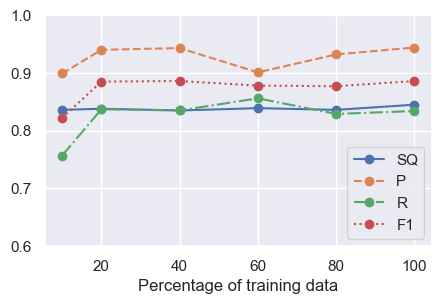

In [108]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(5, 3))

mask2former_training.plot(ax=axes, ylim=(0.6, 1),
                                             style=['-', '--', '-.', ':'], marker='o')

axes.set_xlabel("Percentage of training data")
plt.savefig('../mask2former_training.png')
plt.show()

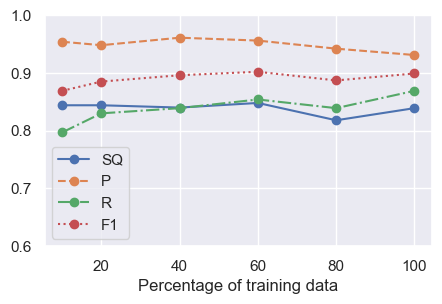

In [109]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(5, 3))

maskrcnn_training.plot(ax=axes, ylim=(0.6, 1),
                                          style=['-', '--', '-.', ':'], marker='o')
axes.set_xlabel("Percentage of training data")
plt.savefig('../maskrcnn_training.png')
plt.show()